In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [2]:
from fastai.conv_learner import *
from fastai.dataset import *

import json, pdb
from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects

## Setup

In [8]:
PATH = Path('data/pascal')
trn_j = json.load((PATH / 'pascal_train2007.json').open())
IMAGES,ANNOTATIONS,CATEGORIES = ['images', 'annotations', 'categories']
FILE_NAME,ID,IMG_ID,CAT_ID,BBOX = 'file_name','id','image_id','category_id','bbox'

cats = dict((o[ID], o['name']) for o in trn_j[CATEGORIES])
trn_fns = dict((o[ID], o[FILE_NAME]) for o in trn_j[IMAGES])
trn_ids = [o[ID] for o in trn_j[IMAGES]]

JPEGS = 'VOC2007/JPEGImages'
IMG_PATH = PATH/JPEGS

In [41]:
trn_fns[17] # dictionary, map img_id to img name
trn_ids[:5] # list of idxs

'000017.jpg'

[12, 17, 23, 26, 32]

In [10]:
# get trn_anno: dictionary with img_id: [([y1,x1,y2,x2],cat_id) , ... ] 
def get_trn_anno():
    trn_anno = collections.defaultdict(lambda:[])
    for o in trn_j[ANNOTATIONS]:
        if not o['ignore']:
            bb = o[BBOX]
            bb = np.array([bb[1], bb[0], bb[3]+bb[1]-1, bb[2]+bb[0]-1])
            trn_anno[o[IMG_ID]].append((bb,o[CAT_ID]))
    return trn_anno

trn_anno = get_trn_anno()

In [12]:
trn_anno[17]

[(array([ 61, 184, 198, 278]), 15), (array([ 77,  89, 335, 402]), 13)]

In [13]:
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.set_xticks(np.linspace(0, 224, 8))
    ax.set_yticks(np.linspace(0, 224, 8))
    ax.grid()
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    return ax

def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

def draw_rect(ax, b, color='white'):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)

def draw_text(ax, xy, txt, sz=14, color='white'):
    text = ax.text(*xy, txt,
        verticalalignment='top', color=color, fontsize=sz, weight='bold')
    draw_outline(text, 1)

In [14]:
def bb_hw(a): return np.array([a[1],a[0],a[3]-a[1],a[2]-a[0]])

def draw_im(im, ann):
    ax = show_img(im, figsize=(16,8))
    for b,c in ann:
        b = bb_hw(b)
        draw_rect(ax, b)
        draw_text(ax, b[:2], cats[c], sz=16)

def draw_idx(i):
    im_a = trn_anno[i]
    im = open_image(IMG_PATH/trn_fns[i])
    draw_im(im, im_a)

## Multi class classification

In [15]:
MC_CSV = PATH/'tmp/mc.csv'

In [17]:
trn_anno[12]

[(array([ 96, 155, 269, 350]), 7)]

In [19]:
trn_anno[17]

[(array([ 61, 184, 198, 278]), 15), (array([ 77,  89, 335, 402]), 13)]

In [20]:
mc = [set([cats[p[1]] for p in trn_anno[o]]) for o in trn_ids]
mcs = [' '.join(str(p) for p in o) for o in mc] # required

In [24]:
mc[:5]
mcs[:5]

[{'car'},
 {'horse', 'person'},
 {'bicycle', 'person'},
 {'car'},
 {'aeroplane', 'person'}]

['car', 'horse person', 'person bicycle', 'car', 'aeroplane person']

In [25]:
df = pd.DataFrame({'fn': [trn_fns[o] for o in trn_ids], 'clas': mcs}, columns=['fn','clas'])
df.to_csv(MC_CSV, index=False)

In [26]:
df.head()

,fn,clas
0,000012.jpg,car
1,000017.jpg,horse person
2,000023.jpg,person bicycle
3,000026.jpg,car
4,000032.jpg,aeroplane person


In [27]:
f_model=resnet34
sz=224
bs=64

In [28]:
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO) # no transformation for multi class 
md = ImageClassifierData.from_csv(PATH, JPEGS, MC_CSV, tfms=tfms)

In [29]:
x,y=next(iter(md.val_dl))

In [35]:
x.shape
y[:5] # one hot. Each row can have multiple 1s

torch.Size([64, 3, 224, 224])



Columns 0 to 12 
    0     1     0     0     0     0     0     0     0     0     0     0     0
    0     0     0     0     0     0     0     0     0     0     0     1     0
    0     0     1     0     0     0     0     0     0     0     0     0     0
    0     0     0     0     0     0     0     0     0     0     0     0     0
    0     0     0     0     1     0     0     0     0     0     0     0     0

Columns 13 to 19 
    0     1     0     0     0     0     0
    0     0     0     0     1     0     0
    0     0     0     0     0     0     0
    0     1     0     0     0     0     0
    0     1     0     0     0     0     0
[torch.cuda.FloatTensor of size 5x20 (GPU 0)]

In [62]:
learn = ConvLearner.pretrained(f_model, md)
learn.opt_fn = optim.Adam

In [46]:
# from IPython.core.debugger import set_trace

In [52]:
lrf=learn.lr_find(1e-5,100)

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

epoch      trn_loss   val_loss   <lambda>                  
    0      1.373644   4.155239   0.849617  



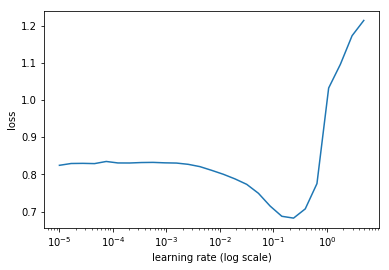

In [53]:
learn.sched.plot(0)

In [63]:
lr = 2e-2

In [64]:
learn.fit(lr, 1, cycle_len=3, use_clr=(32,3))

HBox(children=(IntProgress(value=0, description='Epoch', max=3), HTML(value='')))

epoch      trn_loss   val_loss   <lambda>                  
    0      0.365448   0.104745   0.965032  
    1      0.188541   0.079702   0.974166                  
    2      0.123005   0.074147   0.974331                  



[0.0741466, 0.9743314385414124]

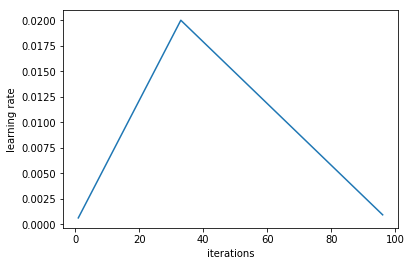

In [65]:
learn.sched.plot_lr()

In [66]:
lrs = np.array([lr/100, lr/10, lr])

In [67]:
learn.freeze_to(-2) #freeze first layer group, finetuning the rest

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

 84%|████████▍ | 27/32 [00:08<00:01,  3.20it/s, loss=0.544] 


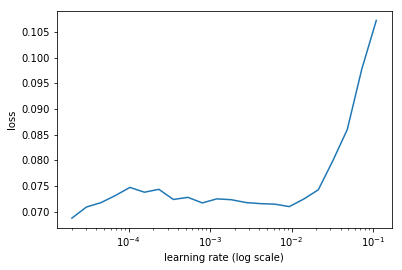

In [68]:
learn.lr_find(lrs/1000)
learn.sched.plot(0)

In [72]:
(lrs/10)[2]

0.002

In [73]:
learn.fit(lrs/10, 1, cycle_len=5, use_clr=(32,5))

HBox(children=(IntProgress(value=0, description='Epoch', max=5), HTML(value='')))

epoch      trn_loss   val_loss   <lambda>                   
    0      0.071498   0.08201    0.971875  
    1      0.053921   0.073042   0.976285                   
    2      0.038394   0.076337   0.975285                   
    3      0.026671   0.076541   0.976089                   
    4      0.019096   0.074961   0.976848                   



[0.07496106, 0.9768479466438293]

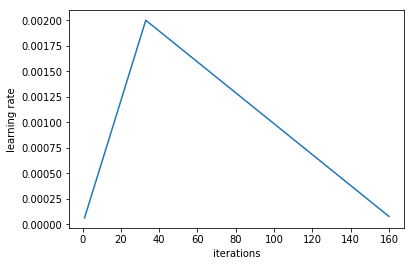

In [74]:
learn.sched.plot_lr()

In [76]:
learn.save('mclas')

In [77]:
learn.load('mclas')

In [78]:
y = learn.predict()
x,_ = next(iter(md.val_dl))
x = to_np(x)

In [80]:
y[:5]

array([[0.     , 0.99813, 0.00016, 0.00019, 0.00455, 0.00205, 0.00234, 0.00007, 0.0064 , 0.00004, 0.00033,
        0.00037, 0.00068, 0.005  , 0.99825, 0.00038, 0.00005, 0.00002, 0.00018, 0.0001 ],
       [0.00001, 0.00108, 0.00001, 0.     , 0.0023 , 0.00436, 0.00809, 0.00501, 0.02639, 0.00014, 0.00002,
        0.99792, 0.00005, 0.00004, 0.16632, 0.00158, 0.00006, 0.75695, 0.00002, 0.00961],
       [0.00017, 0.00009, 0.99891, 0.00034, 0.00073, 0.00002, 0.00215, 0.00058, 0.00048, 0.00023, 0.00004,
        0.00042, 0.00018, 0.00031, 0.00002, 0.0002 , 0.1098 , 0.00005, 0.00023, 0.00002],
       [0.0001 , 0.00077, 0.00415, 0.00204, 0.07276, 0.00083, 0.00058, 0.00067, 0.03053, 0.00013, 0.00231,
        0.00327, 0.00285, 0.00011, 0.99976, 0.00452, 0.00075, 0.00036, 0.00027, 0.00411],
       [0.00001, 0.00071, 0.00035, 0.00004, 0.00625, 0.00008, 0.00302, 0.00016, 0.00468, 0.00007, 0.00015,
        0.00283, 0.00081, 0.00035, 0.99994, 0.00197, 0.0007 , 0.00068, 0.00006, 0.00091]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


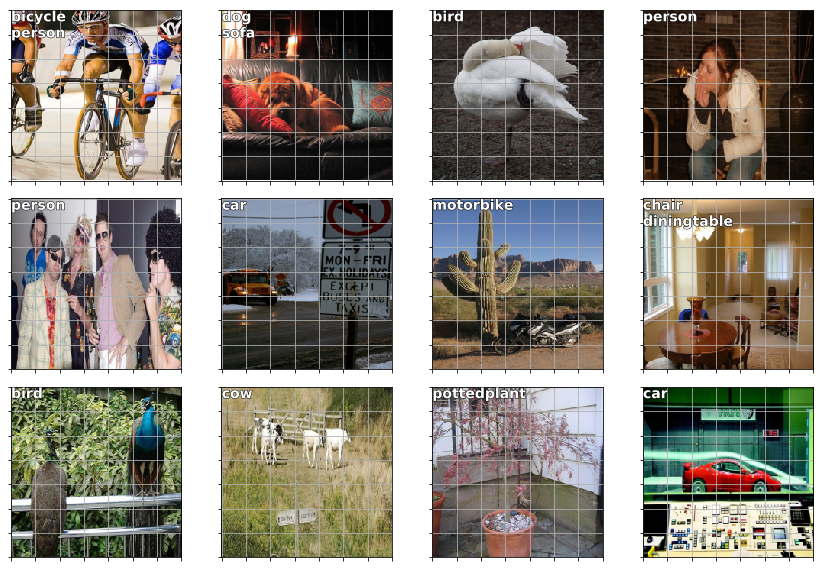

In [81]:
fig, axes = plt.subplots(3, 4, figsize=(12, 8))
for i,ax in enumerate(axes.flat):
    ima=md.val_ds.denorm(x)[i]
    ya = np.nonzero(y[i]>0.4)[0]
    b = '\n'.join(md.classes[o] for o in ya)
    ax = show_img(ima, ax=ax)
    draw_text(ax, (0,0), b)
plt.tight_layout()

## Bbox per cell: Multiple label + Multiple bbox prediction within 1 model

### Set up data

In [82]:
CLAS_CSV = PATH/'tmp/clas.csv'
MBB_CSV = PATH/'tmp/mbb.csv'

f_model=resnet34
sz=224
bs=64

In [83]:
mc = [[cats[p[1]] for p in trn_anno[o]] for o in trn_ids]
id2cat = list(cats.values())
cat2id = {v:k for k,v in enumerate(id2cat)}
mcs = np.array([np.array([cat2id[p] for p in o]) for o in mc]); mcs
# mcs: list of multiple categories for each img

array([array([6]), array([14, 12]), array([ 1,  1, 14, 14, 14]), ..., array([17,  8, 14, 14, 14]),
       array([6]), array([11])], dtype=object)

In [136]:
for i in range(5):
    print(mcs[i])
mc[:5]

[6]
[14 12]
[ 1  1 14 14 14]
[6]
[ 0  0 14 14]


[['car'],
 ['person', 'horse'],
 ['bicycle', 'bicycle', 'person', 'person', 'person'],
 ['car'],
 ['aeroplane', 'aeroplane', 'person', 'person']]

In [94]:
def func1(*a):
    return a[0]+a[1]
temp1,temp2=1,2
func1(temp1,temp2)

3

In [91]:
??split_by_idx

In [90]:
val_idxs = get_cv_idxs(len(trn_fns))
((val_mcs,trn_mcs),) = split_by_idx(val_idxs, mcs)

In [100]:
val_mcs[:5]

array([array([ 1, 14, 14]), array([11, 17]), array([2]), array([14]), array([14, 14, 14, 14, 14,  4,  4])],
      dtype=object)

In [101]:
mbb = [np.concatenate([p[0] for p in trn_anno[o]]) for o in trn_ids]
mbbs = [' '.join(str(p) for p in o) for o in mbb]

df = pd.DataFrame({'fn': [trn_fns[o] for o in trn_ids], 'bbox': mbbs}, columns=['fn','bbox'])
df.to_csv(MBB_CSV, index=False)

In [104]:
mbb[:5]
mbbs[:5]

[array([ 96, 155, 269, 350]),
 array([ 61, 184, 198, 278,  77,  89, 335, 402]),
 array([229,   8, 499, 244, 219, 229, 499, 333,   0,   1, 368, 116,   1,   2, 461, 242,   0, 224, 485, 333]),
 array([124,  89, 211, 336]),
 array([ 77, 103, 182, 374,  87, 132, 122, 196, 179, 194, 228, 212, 188,  25, 237,  43])]

['96 155 269 350',
 '61 184 198 278 77 89 335 402',
 '229 8 499 244 219 229 499 333 0 1 368 116 1 2 461 242 0 224 485 333',
 '124 89 211 336',
 '77 103 182 374 87 132 122 196 179 194 228 212 188 25 237 43']

In [102]:
df.head()

,fn,bbox
0,000012.jpg,96 155 269 350
1,000017.jpg,61 184 198 278 77 89 335 402
2,000023.jpg,229 8 499 244 219 229 499 333 0 1 368 116 1 2 ...
3,000026.jpg,124 89 211 336
4,000032.jpg,77 103 182 374 87 132 122 196 179 194 228 212 ...


In [105]:
aug_tfms = [RandomRotate(10, tfm_y=TfmType.COORD),
            RandomLighting(0.05, 0.05, tfm_y=TfmType.COORD),
            RandomFlip(tfm_y=TfmType.COORD)]
# TODO: these aug...
# tfm_y and crop_type are similar to 1 label+ 1 bbox one-model prediction
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO, tfm_y=TfmType.COORD, aug_tfms=aug_tfms)
md = ImageClassifierData.from_csv(PATH, JPEGS, MBB_CSV, tfms=tfms, continuous=True, num_workers=4)

In [106]:
import matplotlib.cm as cmx
import matplotlib.colors as mcolors
from cycler import cycler

def get_cmap(N):
    color_norm  = mcolors.Normalize(vmin=0, vmax=N-1)
    return cmx.ScalarMappable(norm=color_norm, cmap='Set3').to_rgba

num_colr = 12 #TODO: hardcode?
cmap = get_cmap(num_colr)
colr_list = [cmap(float(x)) for x in range(num_colr)]

In [112]:
#TODO what is this?
len(colr_list)
colr_list

12

[(0.5529411764705883, 0.8274509803921568, 0.7803921568627451, 1.0),
 (1.0, 1.0, 0.7019607843137254, 1.0),
 (0.7450980392156863, 0.7294117647058823, 0.8549019607843137, 1.0),
 (0.984313725490196, 0.5019607843137255, 0.4470588235294118, 1.0),
 (0.5019607843137255, 0.6941176470588235, 0.8274509803921568, 1.0),
 (0.9921568627450981, 0.7058823529411765, 0.3843137254901961, 1.0),
 (0.7019607843137254, 0.8705882352941177, 0.4117647058823529, 1.0),
 (0.9882352941176471, 0.803921568627451, 0.8980392156862745, 1.0),
 (0.8509803921568627, 0.8509803921568627, 0.8509803921568627, 1.0),
 (0.7372549019607844, 0.5019607843137255, 0.7411764705882353, 1.0),
 (0.8, 0.9215686274509803, 0.7725490196078432, 1.0),
 (1.0, 0.9294117647058824, 0.43529411764705883, 1.0)]

In [113]:
def show_ground_truth(ax, im, bbox, clas=None, prs=None, thresh=0.3):
    bb = [bb_hw(o) for o in bbox.reshape(-1,4)]
    if prs is None:  prs  = [None]*len(bb)
    if clas is None: clas = [None]*len(bb)
    ax = show_img(im, ax=ax)
    for i,(b,c,pr) in enumerate(zip(bb, clas, prs)):
        if((b[2]>0) and (pr is None or pr > thresh)):
            draw_rect(ax, b, color=colr_list[i%num_colr])
            txt = f'{i}: '
            if c is not None: txt += ('bg' if c==len(id2cat) else id2cat[c])
            if pr is not None: txt += f' {pr:.2f}'
            draw_text(ax, b[:2], txt, color=colr_list[i%num_colr])

In [114]:
class ConcatLblDataset(Dataset): 
    # create new dataset with original X and new y which is a tuple: (y_bbox,y_label)
    # inherit torch Dataset
    
    def __init__(self, ds, y2): 
        self.ds,self.y2 = ds,y2
        self.sz = ds.sz
    #self.ds contains np array X and y of bbox dataset
    def __len__(self): return len(self.ds)
    
    def __getitem__(self, i):
        x,y = self.ds[i]
        return (x, (y,self.y2[i])) # (X,(y_bbox,y_label))

In [115]:
# md.trn_ds (created from ImageClassifierData.from_csv) and trn_mcs (from get_cv_idxs) have same indices
# as .from_csv also used get_cv_idxs func
trn_ds2 = ConcatLblDataset(md.trn_ds, trn_mcs)
val_ds2 = ConcatLblDataset(md.val_ds, val_mcs)
md.trn_dl.dataset = trn_ds2
md.val_dl.dataset = val_ds2

In [116]:
x,y=to_np(next(iter(md.trn_dl)))
x=md.trn_ds.ds.denorm(x)

In [117]:
x,y=to_np(next(iter(md.val_dl)))
x=md.val_ds.ds.denorm(x)

In [129]:
x.shape
y[0].shape # largest # of bbox assigned to an img (14*4=56). TODO: why?
y[1].shape # largest # of labels assigned to an img for this dataset

(64, 224, 224, 3)

(64, 56)

(64, 14)

In [138]:
y[0][:4]
y[1][:4]

array([[  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  91.,  47., 223., 169.,
          0.,  49., 205., 180.,   9., 169., 217., 222.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         81.,  49., 166., 171.,  63.,   1., 222., 223.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.

array([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1, 14, 14],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 11, 17],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  2],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 14]])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


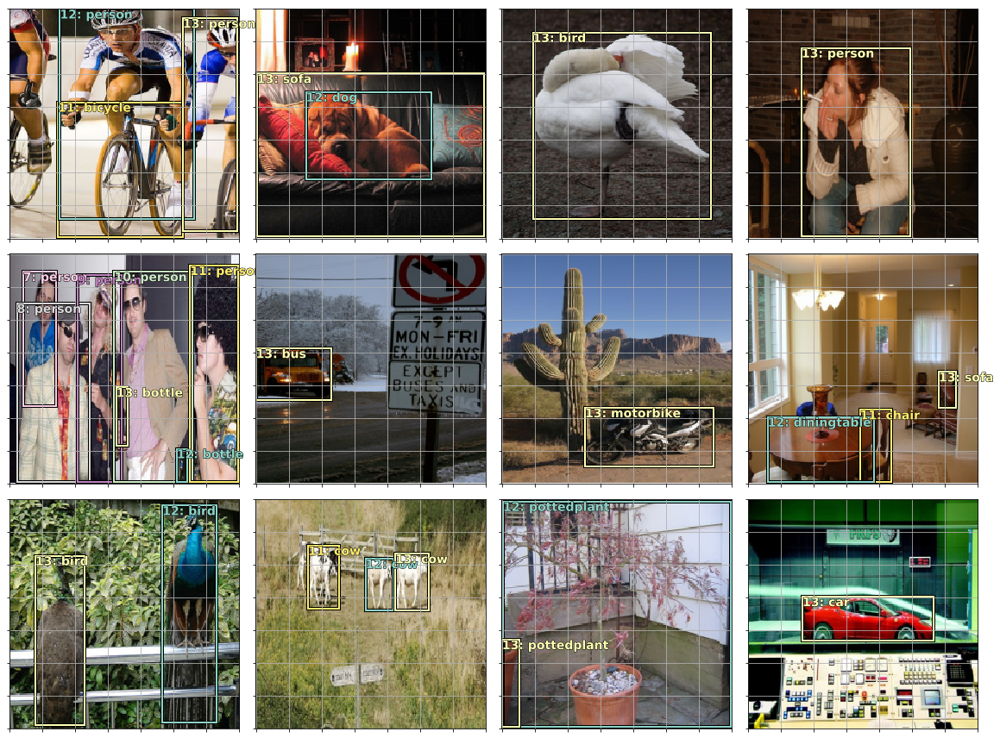

In [139]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for i,ax in enumerate(axes.flat):
    show_ground_truth(ax, x[i], y[0][i], y[1][i])
plt.tight_layout()

### Set up model (TODO)

We're going to make a simple first model that simply predicts what object is located in each cell of a 2x2 grid. Later on we can try to improve this.

In [376]:
anc_grid = 4
k = 1

anc_offset = 1/(anc_grid*2)
anc_x = np.tile(np.linspace(anc_offset, 1-anc_offset, anc_grid), anc_grid)
anc_y = np.repeat(np.linspace(anc_offset, 1-anc_offset, anc_grid), anc_grid)

anc_ctrs = np.tile(np.stack([anc_x,anc_y], axis=1), (k,1))
anc_sizes = np.array([[1/anc_grid,1/anc_grid] for i in range(anc_grid*anc_grid)])
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()

In [377]:
grid_sizes = V(np.array([1/anc_grid]), requires_grad=False).unsqueeze(1)

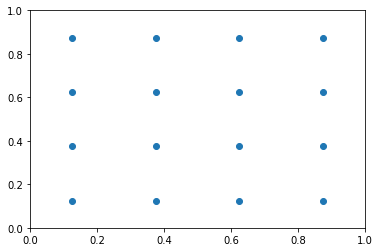

In [378]:
plt.scatter(anc_x, anc_y)
plt.xlim(0, 1)
plt.ylim(0, 1);

In [379]:
anchors

Variable containing:
 0.1250  0.1250  0.2500  0.2500
 0.3750  0.1250  0.2500  0.2500
 0.6250  0.1250  0.2500  0.2500
 0.8750  0.1250  0.2500  0.2500
 0.1250  0.3750  0.2500  0.2500
 0.3750  0.3750  0.2500  0.2500
 0.6250  0.3750  0.2500  0.2500
 0.8750  0.3750  0.2500  0.2500
 0.1250  0.6250  0.2500  0.2500
 0.3750  0.6250  0.2500  0.2500
 0.6250  0.6250  0.2500  0.2500
 0.8750  0.6250  0.2500  0.2500
 0.1250  0.8750  0.2500  0.2500
 0.3750  0.8750  0.2500  0.2500
 0.6250  0.8750  0.2500  0.2500
 0.8750  0.8750  0.2500  0.2500
[torch.cuda.FloatTensor of size 16x4 (GPU 0)]

In [380]:
def hw2corners(ctr, hw): return torch.cat([ctr-hw/2, ctr+hw/2], dim=1)

In [381]:
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])
anchor_cnr

Variable containing:
 0.0000  0.0000  0.2500  0.2500
 0.2500  0.0000  0.5000  0.2500
 0.5000  0.0000  0.7500  0.2500
 0.7500  0.0000  1.0000  0.2500
 0.0000  0.2500  0.2500  0.5000
 0.2500  0.2500  0.5000  0.5000
 0.5000  0.2500  0.7500  0.5000
 0.7500  0.2500  1.0000  0.5000
 0.0000  0.5000  0.2500  0.7500
 0.2500  0.5000  0.5000  0.7500
 0.5000  0.5000  0.7500  0.7500
 0.7500  0.5000  1.0000  0.7500
 0.0000  0.7500  0.2500  1.0000
 0.2500  0.7500  0.5000  1.0000
 0.5000  0.7500  0.7500  1.0000
 0.7500  0.7500  1.0000  1.0000
[torch.cuda.FloatTensor of size 16x4 (GPU 0)]

In [382]:
n_clas = len(id2cat)+1
n_act = k*(4+n_clas)

In [383]:
class StdConv(nn.Module):
    def __init__(self, nin, nout, stride=2, drop=0.1):
        super().__init__()
        self.conv = nn.Conv2d(nin, nout, 3, stride=stride, padding=1)
        self.bn = nn.BatchNorm2d(nout)
        self.drop = nn.Dropout(drop)
        
    def forward(self, x): return self.drop(self.bn(F.relu(self.conv(x))))
        
def flatten_conv(x,k): return x.view(x.size(0),x.size(1)//k,-1).transpose(1,2)

In [384]:
class OutConv(nn.Module):
    def __init__(self, k, nin, bias):
        super().__init__()
        self.k = k
        self.oconv1 = nn.Conv2d(nin, (len(id2cat)+1)*k, 3, padding=1)
        self.oconv2 = nn.Conv2d(nin, 4*k, 3, padding=1)
        self.oconv1.bias.data.zero_().add_(bias)
        
    def forward(self, x):
        return [flatten_conv(self.oconv1(x), self.k),
                flatten_conv(self.oconv2(x), self.k)]

In [393]:
class SSD_Head(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(0.25)
        self.sconv0 = StdConv(512,256, stride=1)
        self.sconv1 = StdConv(256,256)
        self.sconv2 = StdConv(256,256)
        self.out = OutConv(k, 256, bias)
        
    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
#         x = self.sconv1(x)
        x = self.sconv2(x)
        return self.out(x)

head_reg4 = SSD_Head(k, -3.)
models = ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam
k

1

### Train

In [394]:
def one_hot_embedding(labels, num_classes):
    return torch.eye(num_classes)[labels.data.cpu()]

class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes

    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes+1)
        t = V(t[:,:-1].contiguous())#.cpu()
        x = pred[:,:-1]
        w = self.get_weight(x,t)
        return F.binary_cross_entropy_with_logits(x, t, w, size_average=False)/self.num_classes
    
    def get_weight(self,x,t): return None

loss_f = BCE_Loss(len(id2cat))

In [395]:
def intersect(box_a, box_b):
    max_xy = torch.min(box_a[:, None, 2:], box_b[None, :, 2:])
    min_xy = torch.max(box_a[:, None, :2], box_b[None, :, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]

def box_sz(b): return ((b[:, 2]-b[:, 0]) * (b[:, 3]-b[:, 1]))

def jaccard(box_a, box_b):
    inter = intersect(box_a, box_b)
    union = box_sz(box_a).unsqueeze(1) + box_sz(box_b).unsqueeze(0) - inter
    return inter / union

In [492]:
def get_y(bbox,clas):
    bbox = bbox.view(-1,4)/sz
    bb_keep = ((bbox[:,2]-bbox[:,0])>0).nonzero()[:,0]
    return bbox[bb_keep],clas[bb_keep]

def actn_to_bb(actn, anchors):
    actn_bbs = torch.tanh(actn)
    actn_centers = (actn_bbs[:,:2]/2 * grid_sizes) + anchors[:,:2]
    actn_hw = (actn_bbs[:,2:]/2+1) * anchors[:,2:]
    return hw2corners(actn_centers, actn_hw)

def map_to_ground_truth(overlaps, print_it=False):
    prior_overlap, prior_idx = overlaps.max(1)
    if print_it: print(prior_overlap)
#     pdb.set_trace()
    gt_overlap, gt_idx = overlaps.max(0)
    gt_overlap[prior_idx] = 1.99
    for i,o in enumerate(prior_idx): gt_idx[o] = i
    return gt_overlap,gt_idx

def ssd_1_loss(b_c,b_bb,bbox,clas,print_it=False, use_ab=True):
    bbox,clas = get_y(bbox,clas)
    a_ic = actn_to_bb(b_bb, anchors)
    overlaps = jaccard(bbox.data, (anchor_cnr if use_ab else a_ic).data)
    gt_overlap,gt_idx = map_to_ground_truth(overlaps,print_it)
    gt_clas = clas[gt_idx]
    pos = gt_overlap > 0.4
    pos_idx = torch.nonzero(pos)[:,0]
    gt_clas[1-pos] = len(id2cat)
    gt_bbox = bbox[gt_idx]
    loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
    clas_loss  = loss_f(b_c, gt_clas)
    return loc_loss, clas_loss

def ssd_loss(pred,targ,print_it=False):
    lcs,lls = 0.,0.
    for b_c,b_bb,bbox,clas in zip(*pred,*targ):
        loc_loss,clas_loss = ssd_1_loss(b_c,b_bb,bbox,clas,print_it)
        lls += loc_loss
        lcs += clas_loss
    if print_it: print(f'loc: {lls.data[0]}, clas: {lcs.data[0]}')
    return lls+lcs

def ssd_loss2(pred,targ):
    lcs,lls = 0.,0.
    for b_c,b_bb,bbox,clas in zip(*pred,*targ):
        loc_loss,clas_loss = ssd_1_loss(b_c,b_bb,bbox,clas,use_ab=False)
        lls += loc_loss
        lcs += clas_loss
    return lls+lcs

In [196]:
x,y = next(iter(md.val_dl))
# x,y = V(x).cpu(),V(y)
x,y = V(x),V(y)

In [ ]:
for i,o in enumerate(y): y[i] = o.cpu()
learn.model.cpu()

In [197]:
batch = learn.model(x)

In [59]:
anchors = anchors.cpu(); grid_sizes = grid_sizes.cpu(); anchor_cnr = anchor_cnr.cpu()

In [198]:
ssd_loss(batch, y, True)


 0.5738
 0.6383
 0.2281
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.4841
 0.5098
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.8792
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7323
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.1677
 0.6007
 0.3556
 0.5499
 0.3761
 0.0138
 0.0334
[torch.cuda.FloatTensor of size 7 (GPU 0)]


 0.4778
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.3603
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.1392
 0.3100
 0.0029
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.3276
 0.2938
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.4733
 0.3420
 0.2983
[torch.cuda.FloatTensor of size 3 (GPU 0)]


1.00000e-02 *
  8.1224
  0.0000
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.4282
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.6121
 0.3561
 0.6220
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.7561
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.3418
 0.7781
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.4571
 0.0012
[torch.cuda.FloatTensor of s

Variable containing:
 28.0493
[torch.cuda.FloatTensor of size 1 (GPU 0)]

In [397]:
learn.crit = ssd_loss
lr = 3e-3
lrs = np.array([lr/100,lr/10,lr])

A Jupyter Widget

epoch      trn_loss   val_loss                            
    0      44.232681  21476.816406



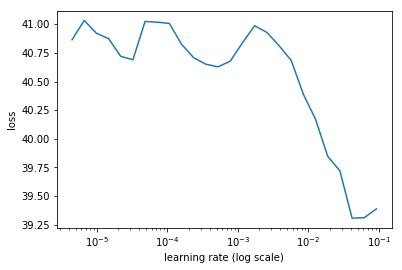

In [204]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(1)

In [398]:
learn.fit(lr, 1, cycle_len=5, use_clr=(20,10))

A Jupyter Widget

epoch      trn_loss   val_loss                            
    0      45.679928  39.025692 
    1      37.307445  31.825516                           
    2      33.550432  30.64724                            
    3      31.164808  29.871582                           
    4      29.57709   29.287346                           



[29.287346]

In [235]:
learn.save('0')

In [135]:
learn.load('0')

### Testing

In [400]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
learn.model.eval()
batch = learn.model(V(x))
b_clas,b_bb = batch

In [401]:
b_clas.size(),b_bb.size()

(torch.Size([64, 16, 21]), torch.Size([64, 16, 4]))

In [402]:
idx=7
b_clasi = b_clas[idx]
b_bboxi = b_bb[idx]
ima=md.val_ds.ds.denorm(to_np(x))[idx]
bbox,clas = get_y(y[0][idx], y[1][idx])
bbox,clas

(Variable containing:
  0.6786  0.4866  0.9911  0.6250
  0.7098  0.0848  0.9911  0.5491
  0.5134  0.8304  0.6696  0.9063
 [torch.cuda.FloatTensor of size 3x4 (GPU 0)], Variable containing:
   8
  10
  17
 [torch.cuda.LongTensor of size 3 (GPU 0)])

In [403]:
def torch_gt(ax, ima, bbox, clas, prs=None, thresh=0.4):
    return show_ground_truth(ax, ima, to_np((bbox*224).long()),
         to_np(clas), to_np(prs) if prs is not None else None, thresh)

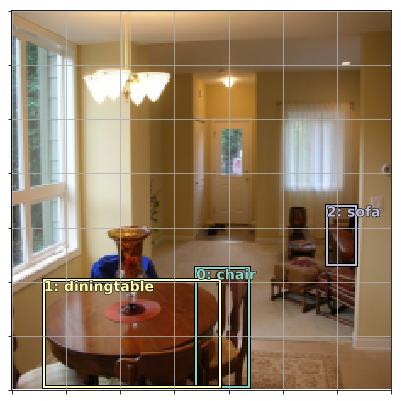

In [404]:
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, bbox, clas)

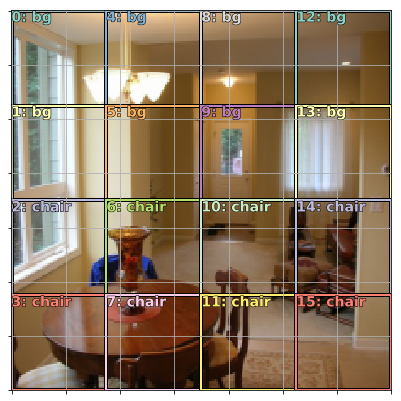

In [405]:
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, anchor_cnr, b_clasi.max(1)[1])

In [406]:
grid_sizes

Variable containing:
 0.2500
[torch.cuda.FloatTensor of size 1x1 (GPU 0)]

In [407]:
anchors

Variable containing:
 0.1250  0.1250  0.2500  0.2500
 0.3750  0.1250  0.2500  0.2500
 0.6250  0.1250  0.2500  0.2500
 0.8750  0.1250  0.2500  0.2500
 0.1250  0.3750  0.2500  0.2500
 0.3750  0.3750  0.2500  0.2500
 0.6250  0.3750  0.2500  0.2500
 0.8750  0.3750  0.2500  0.2500
 0.1250  0.6250  0.2500  0.2500
 0.3750  0.6250  0.2500  0.2500
 0.6250  0.6250  0.2500  0.2500
 0.8750  0.6250  0.2500  0.2500
 0.1250  0.8750  0.2500  0.2500
 0.3750  0.8750  0.2500  0.2500
 0.6250  0.8750  0.2500  0.2500
 0.8750  0.8750  0.2500  0.2500
[torch.cuda.FloatTensor of size 16x4 (GPU 0)]

In [408]:
a_ic = actn_to_bb(b_bboxi, anchors)

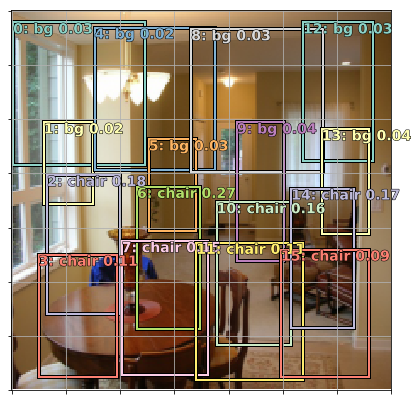

In [409]:
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, a_ic, b_clasi.max(1)[1], b_clasi.max(1)[0].sigmoid(), thresh=0.0)

In [410]:
overlaps = jaccard(bbox.data, anchor_cnr.data)
overlaps



Columns 0 to 9 
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0091  0.0315  0.0000  0.0000
 0.0000  0.0000  0.0356  0.2598  0.0000  0.0000  0.0549  0.4538  0.0000  0.0000
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000

Columns 10 to 15 
 0.0922  0.3985  0.0000  0.0000  0.0000  0.0000
 0.0103  0.0653  0.0000  0.0000  0.0000  0.0000
 0.0000  0.0000  0.0000  0.0000  0.1897  0.0000
[torch.cuda.FloatTensor of size 3x16 (GPU 0)]

In [411]:
overlaps.max(1)

(
  0.3985
  0.4538
  0.1897
 [torch.cuda.FloatTensor of size 3 (GPU 0)], 
  11
   7
  14
 [torch.cuda.LongTensor of size 3 (GPU 0)])

In [416]:
overlaps.max(0)

(
  0.0000
  0.0000
  0.0356
  0.2598
  0.0000
  0.0000
  0.0549
  0.4538
  0.0000
  0.0000
  0.0922
  0.3985
  0.0000
  0.0000
  0.1897
  0.0000
 [torch.cuda.FloatTensor of size 16 (GPU 0)], 
  0
  0
  1
  1
  0
  0
  1
  1
  0
  0
  0
  0
  0
  0
  2
  0
 [torch.cuda.LongTensor of size 16 (GPU 0)])

In [417]:
gt_overlap,gt_idx = map_to_ground_truth(overlaps)
gt_overlap,gt_idx

(
  0.0000
  0.0000
  0.0356
  0.2598
  0.0000
  0.0000
  0.0549
  1.9900
  0.0000
  0.0000
  0.0922
  1.9900
  0.0000
  0.0000
  1.9900
  0.0000
 [torch.cuda.FloatTensor of size 16 (GPU 0)], 
  0
  0
  1
  1
  0
  0
  1
  1
  0
  0
  0
  0
  0
  0
  2
  0
 [torch.cuda.LongTensor of size 16 (GPU 0)])

In [421]:
gt_clas = clas[gt_idx]; gt_clas

Variable containing:
  8
  8
 10
 10
  8
  8
 10
 10
  8
  8
  8
  8
  8
  8
 17
  8
[torch.cuda.LongTensor of size 16 (GPU 0)]

In [422]:
thresh = 0.5
pos = gt_overlap > thresh
pos_idx = torch.nonzero(pos)[:,0]
neg_idx = torch.nonzero(1-pos)[:,0]
pos_idx


  7
 11
 14
[torch.cuda.LongTensor of size 3 (GPU 0)]

In [423]:
gt_clas[1-pos] = len(id2cat)
[id2cat[o] if o<len(id2cat) else 'bg' for o in gt_clas.data]

['bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'diningtable',
 'bg',
 'bg',
 'bg',
 'chair',
 'bg',
 'bg',
 'sofa',
 'bg']

In [424]:
gt_bbox = bbox[gt_idx]
loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
clas_loss  = F.cross_entropy(b_clasi, gt_clas)
loc_loss,clas_loss

(Variable containing:
 1.00000e-02 *
   7.4401
 [torch.cuda.FloatTensor of size 1 (GPU 0)], Variable containing:
  1.3763
 [torch.cuda.FloatTensor of size 1 (GPU 0)])

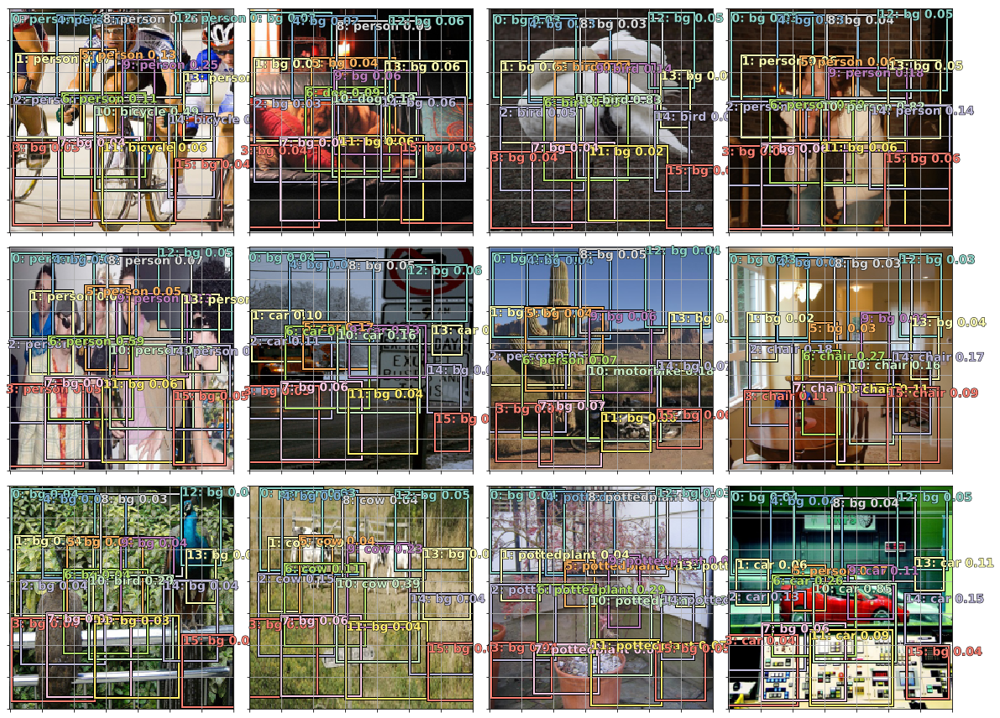

In [426]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(bbox,clas); bbox,clas
    a_ic = actn_to_bb(b_bb[idx], anchors)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.01)
plt.tight_layout()

## More anchors!

### Create anchors

In [485]:
anc_grids = [4,2,1]
# anc_grids = [4]
anc_zooms = [0.75, 1., 1.3]
# anc_zooms = [1.]
anc_ratios = [(1.,1.), (1.,0.5), (0.5,1.)]
# anc_ratios = [(1.,1.)]
anchor_scales = [(anz*i,anz*j) for anz in anc_zooms for (i,j) in anc_ratios]
k = len(anchor_scales)
anc_offsets = [1/(o*2) for o in anc_grids]

In [486]:
anc_x = np.concatenate([np.tile(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_y = np.concatenate([np.repeat(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_ctrs = np.repeat(np.stack([anc_x,anc_y], axis=1), k, axis=0)

In [487]:
anc_sizes  =   np.concatenate([np.array([[o/ag,p/ag] for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids])
grid_sizes = V(np.concatenate([np.array([ 1/ag       for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids]), requires_grad=False).unsqueeze(1)
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])

In [304]:
x,y=to_np(next(iter(md.val_dl)))
x=md.val_ds.ds.denorm(x)

In [305]:
a=np.reshape((to_np(anchor_cnr) + to_np(torch.randn(*anchor_cnr.size()))*0.01)*224, -1)

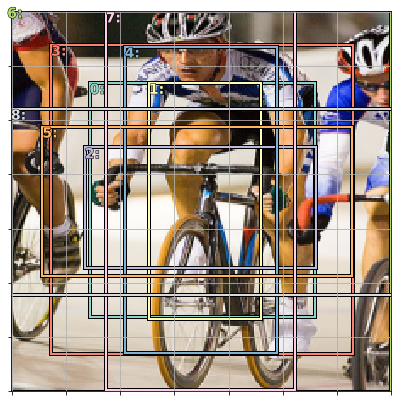

In [495]:
fig, ax = plt.subplots(figsize=(7,7))
show_ground_truth(ax, x[0], a)

### Model

In [551]:
drop=0.4

class SSD_MultiHead(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(drop)
        self.sconv1 = StdConv(512,256, drop=drop)
        self.sconv2 = StdConv(256,256, drop=drop)
        self.sconv3 = StdConv(256,256, drop=drop)
        self.out0 = OutConv(k, 256, bias)
        self.out1 = OutConv(k, 256, bias)
        self.out2 = OutConv(k, 256, bias)
        self.out3 = OutConv(k, 256, bias)

    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv1(x)
        o1c,o1l = self.out1(x)
        x = self.sconv2(x)
        o2c,o2l = self.out2(x)
        x = self.sconv3(x)
        o3c,o3l = self.out3(x)
#         return [o1c, o1l]
        return [torch.cat([o1c,o2c,o3c], dim=1),
                torch.cat([o1l,o2l,o3l], dim=1)]

head_reg4 = SSD_MultiHead(k, -4.)
models = ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam

In [552]:
learn.crit = ssd_loss
lr = 1e-2
lrs = np.array([lr/100,lr/10,lr])

In [438]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch = learn.model(V(x))

In [439]:
batch[0].size(),batch[1].size()

(torch.Size([64, 189, 21]), torch.Size([64, 189, 4]))

In [440]:
ssd_loss(batch, y, True)


 0.5598
 0.7922
 0.3095
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.5718
 0.7035
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.8714
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7268
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.5163
 0.4763
 0.4033
 0.4986
 0.2990
 0.0887
 0.1046
[torch.cuda.FloatTensor of size 7 (GPU 0)]


 0.3789
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.5153
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.3985
 0.6215
 0.5547
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.4246
 0.5208
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.3436
 0.3257
 0.5062
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.9734
 0.2506
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.3900
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7722
 0.5395
 0.6392
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.7618
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.4679
 0.8070
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.6597
 0.1274
[torch.cuda.FloatTensor of size 2 (GPU 0)]



Variable containing:
 65.8664
[torch.cuda.FloatTensor of size 1 (GPU 0)]

In [ ]:
learn.lr_find(lrs/1000,1.)

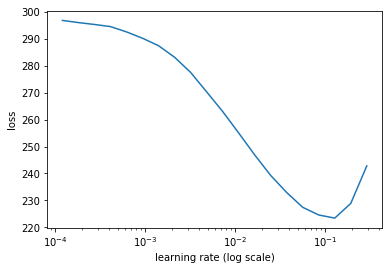

In [432]:
learn.sched.plot(n_skip_end=2)

In [434]:
learn.fit(lrs, 1, cycle_len=4, use_clr=(20,8))

A Jupyter Widget

epoch      trn_loss   val_loss                           
    0      122.641947 103.810165
    1      99.537125  80.167664                           
    2      86.728296  72.602615                           
    3      78.494606  69.90522                            



[69.90522]

In [435]:
learn.save('tmp')

In [436]:
learn.freeze_to(-2)
learn.fit(lrs/2, 1, cycle_len=4, use_clr=(20,8))

A Jupyter Widget

epoch      trn_loss   val_loss                            
    0      71.597645  74.080742 
    1      68.654575  68.76886                            
    2      64.880411  64.424332                           
    3      61.149371  62.800404                           



[62.800404]

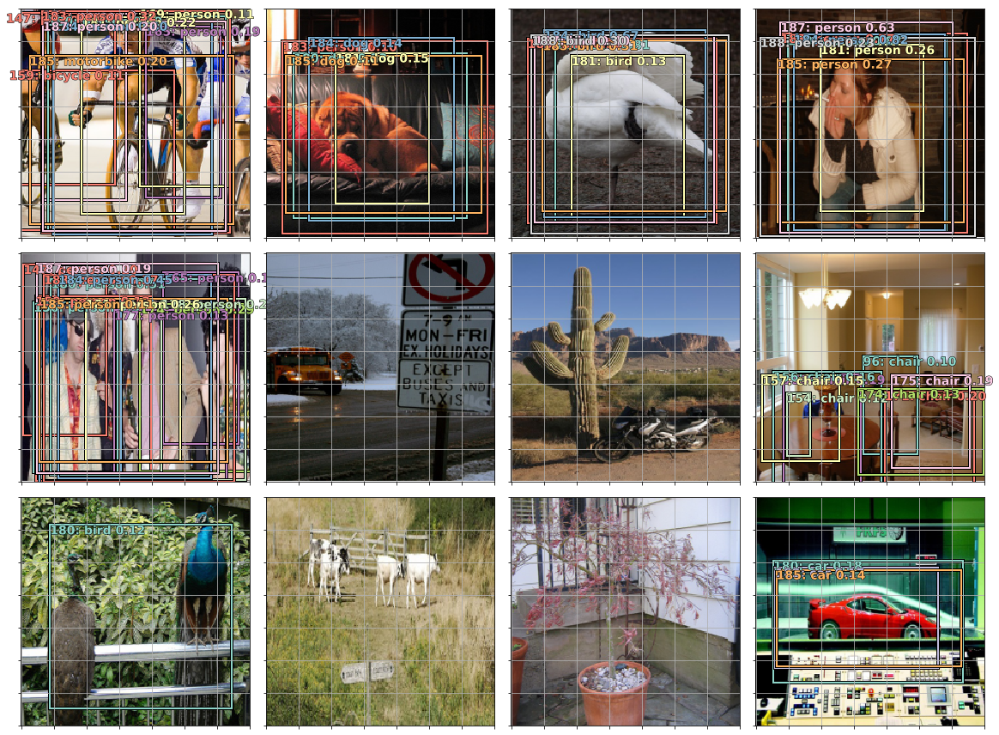

In [441]:
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(x)[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.1)
plt.tight_layout()

## Focal loss

In [553]:
def plot_results(thresh):
    x,y = next(iter(md.val_dl))
    y = V(y)
    batch = learn.model(V(x))
    b_clas,b_bb = batch

    x = to_np(x)
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    for idx,ax in enumerate(axes.flat):
        ima=md.val_ds.ds.denorm(x)[idx]
        bbox,clas = get_y(y[0][idx], y[1][idx])
        a_ic = actn_to_bb(b_bb[idx], anchors)
        clas_pr, clas_ids = b_clas[idx].max(1)
        clas_pr = clas_pr.sigmoid()
        torch_gt(ax, ima, a_ic, clas_ids, clas_pr, clas_pr.max().data[0]*thresh)
    plt.tight_layout()

In [554]:
class FocalLoss(BCE_Loss):
    def get_weight(self,x,t):
        alpha,gamma = 0.25,2.
        p = x.sigmoid()
#         pt = p if t else (1-p)
        pt = p*t + (1-p)*(1-t)
#         w = alpha if t else (1-alpha)
        w = alpha*t + (1-alpha)*(1-t)
        return w * (1-pt).pow(gamma)

loss_f = FocalLoss(len(id2cat))

In [480]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch = learn.model(x)
ssd_loss(batch, y, True)


 0.5598
 0.7922
 0.3095
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.5718
 0.7035
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.8714
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7268
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.5163
 0.4763
 0.4033
 0.4986
 0.2990
 0.0887
 0.1046
[torch.cuda.FloatTensor of size 7 (GPU 0)]


 0.3789
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.5153
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.3985
 0.6215
 0.5547
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.4246
 0.5208
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.3436
 0.3257
 0.5062
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.9734
 0.2506
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.3900
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7722
 0.5395
 0.6392
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.7618
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.4679
 0.8070
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.6597
 0.1274
[torch.cuda.FloatTensor of size 2 (GPU 0)]



Variable containing:
 5.6477
[torch.cuda.FloatTensor of size 1 (GPU 0)]

In [463]:
learn.lr_find(lrs/1000,1.)

A Jupyter Widget

 94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s, loss=237] 

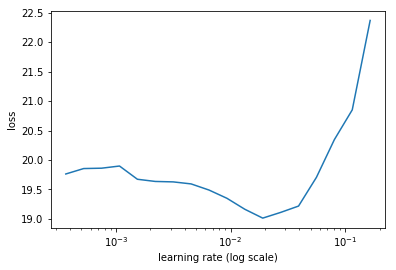

In [464]:
learn.sched.plot(n_skip_end=2)

In [498]:
learn.fit(lrs/2, 1, cycle_len=10, use_clr=(20,10))

A Jupyter Widget

epoch      trn_loss   val_loss                            
    0      23.847809  26.748623 
    1      19.289441  16.628231                           
    2      16.760145  14.844467                           
    3      15.124376  14.295423                           
    4      13.93739   13.587664                           
    5      12.936281  13.213276                           
    6      12.278742  12.91062                            
    7      11.653551  12.716497                           
    8      11.129679  12.428722                           
    9      10.693531  12.352028                           



[12.352028]

In [499]:
learn.save('fl0')

In [472]:
learn.load('fl0')

In [500]:
learn.freeze_to(-2)
learn.fit(lrs/4, 1, cycle_len=10, use_clr=(20,10))

A Jupyter Widget

epoch      trn_loss   val_loss                            
    0      10.882854  13.353344 
    1      11.207746  12.962736                           
    2      10.911916  12.831929                           
    3      10.486524  12.175648                           
    4      10.074516  12.113869                           
    5      9.654045   11.849638                           
    6      9.276244   11.743406                           
    7      8.901401   11.511574                           
    8      8.589617   11.397587                           
    9      8.297138   11.364262                           



[11.364262]

In [501]:
learn.save('drop4')

In [39]:
learn.load('drop4')

In [502]:
learn.unfreeze()
learn.fit(lrs/8, 1, cycle_len=10, use_clr=(20,10))

A Jupyter Widget

epoch      trn_loss   val_loss                            
    0      8.06235    11.889707 
    1      8.288677   11.73222                            
    2      8.302075   11.709153                           
    3      8.187543   11.507583                           
    4      8.017198   11.53261                            
    5      7.861279   11.520564                           
    6      7.67148    11.403015                           
    7      7.507462   11.379685                           
    8      7.411487   11.329998                           
    9      7.288332   11.34363                            



[11.34363]

In [503]:
learn.save('drop4_uf')

In [506]:
learn.load('drop4_uf')

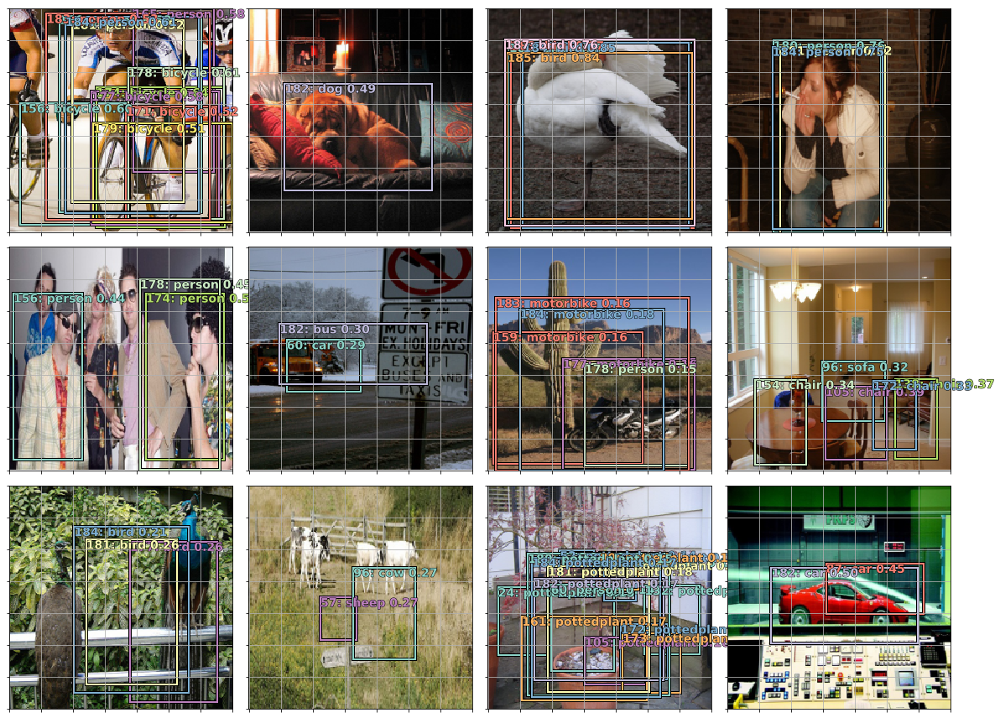

In [504]:
plot_results(0.8)

In [555]:
learn.fit(lrs/2, 1, cycle_len=10, use_clr=(20,10))

A Jupyter Widget

epoch      trn_loss   val_loss                            
    0      25.196324  26.999437 
    1      20.128322  16.560591                           
    2      17.674716  15.147251                           
    3      16.021017  14.332522                           
    4      14.72806   13.853237                           
    5      13.817715  13.396904                           
    6      13.02217   13.000149                           
    7      12.394488  12.69488                            
    8      11.907887  12.523217                           
    9      11.4779    12.467362                           



[12.467362]

In [556]:
learn.save('fl0')

In [557]:
learn.freeze_to(-2)
learn.fit(lrs/4, 1, cycle_len=10, use_clr=(20,10))

A Jupyter Widget

epoch      trn_loss   val_loss                            
    0      11.60712   13.153911 
    1      11.94904   13.298718                           
    2      11.793871  12.749193                           
    3      11.299168  12.289295                           
    4      10.872641  12.154593                           
    5      10.416466  11.881687                           
    6      9.968273   11.742666                           
    7      9.570598   11.536714                           
    8      9.259461   11.398336                           
    9      9.000895   11.364449                           



[11.364449]

In [558]:
learn.save('drop4')

In [559]:
learn.unfreeze()
learn.fit(lrs/8, 1, cycle_len=10, use_clr=(20,10))

A Jupyter Widget

epoch      trn_loss   val_loss                            
    0      8.725976   11.781166 
    1      8.929616   12.043505                           
    2      8.946675   11.739614                           
    3      8.906874   11.748823                           
    4      8.751506   11.518177                           
    5      8.601208   11.498053                           
    6      8.419662   11.50956                            
    7      8.211631   11.422235                           
    8      8.025852   11.405914                           
    9      7.938413   11.346274                           



[11.346274]

In [560]:
learn.save('drop4_uf')

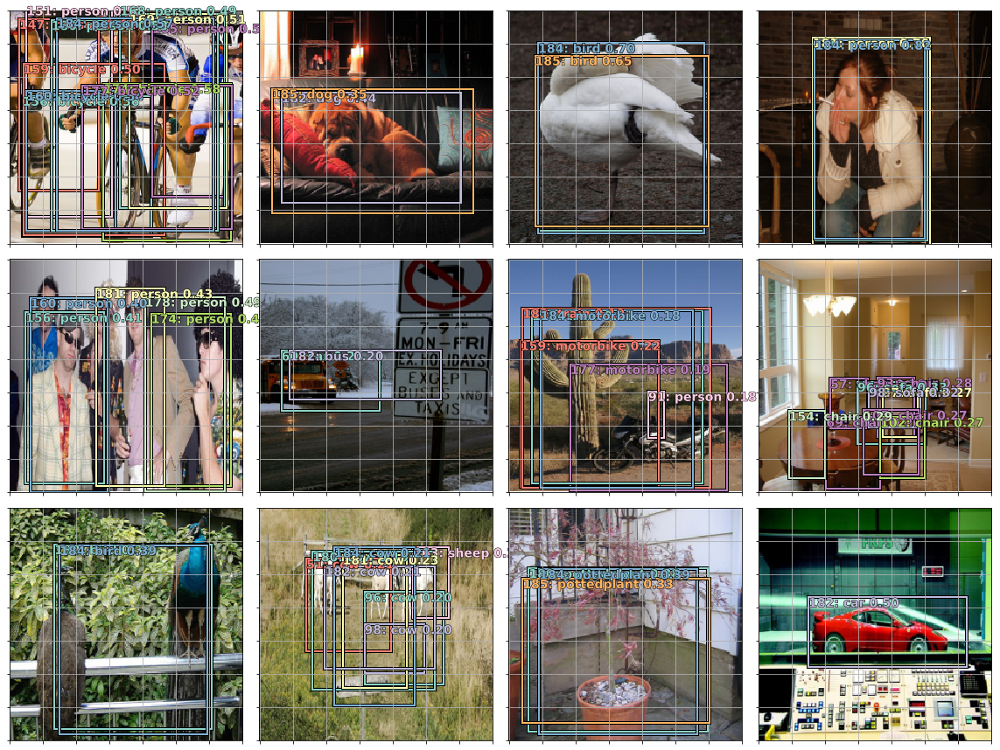

In [561]:
plot_results(0.8)

In [562]:
learn.fit(lrs/16, 1, cycle_len=20, use_clr=(20,10))

A Jupyter Widget

epoch      trn_loss   val_loss                            
    0      7.666083   11.406783 
    1      7.76878    11.406643                           
    2      7.792567   11.545846                           
    3      7.839223   11.431393                           
    4      7.783112   11.405411                           
    5      7.651951   11.589074                           
    6      7.557992   11.46369                            
    7      7.511297   11.512842                           
    8      7.430704   11.387757                           
    9      7.439743   11.432055                           
    10     7.36869    11.523895                           
    11     7.274737   11.466051                           
    12     7.222918   11.463669                           
    13     7.169242   11.485264                           
    14     7.086689   11.434057                           
    15     7.068958   11.40205                            
    16     7.040531   1

[11.417665]

### NMS

In [563]:
def nms(boxes, scores, overlap=0.5, top_k=100):
    keep = scores.new(scores.size(0)).zero_().long()
    if boxes.numel() == 0: return keep
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    area = torch.mul(x2 - x1, y2 - y1)
    v, idx = scores.sort(0)  # sort in ascending order
    idx = idx[-top_k:]  # indices of the top-k largest vals
    xx1 = boxes.new()
    yy1 = boxes.new()
    xx2 = boxes.new()
    yy2 = boxes.new()
    w = boxes.new()
    h = boxes.new()

    count = 0
    while idx.numel() > 0:
        i = idx[-1]  # index of current largest val
        keep[count] = i
        count += 1
        if idx.size(0) == 1: break
        idx = idx[:-1]  # remove kept element from view
        # load bboxes of next highest vals
        torch.index_select(x1, 0, idx, out=xx1)
        torch.index_select(y1, 0, idx, out=yy1)
        torch.index_select(x2, 0, idx, out=xx2)
        torch.index_select(y2, 0, idx, out=yy2)
        # store element-wise max with next highest score
        xx1 = torch.clamp(xx1, min=x1[i])
        yy1 = torch.clamp(yy1, min=y1[i])
        xx2 = torch.clamp(xx2, max=x2[i])
        yy2 = torch.clamp(yy2, max=y2[i])
        w.resize_as_(xx2)
        h.resize_as_(yy2)
        w = xx2 - xx1
        h = yy2 - yy1
        # check sizes of xx1 and xx2.. after each iteration
        w = torch.clamp(w, min=0.0)
        h = torch.clamp(h, min=0.0)
        inter = w*h
        # IoU = i / (area(a) + area(b) - i)
        rem_areas = torch.index_select(area, 0, idx)  # load remaining areas)
        union = (rem_areas - inter) + area[i]
        IoU = inter/union  # store result in iou
        # keep only elements with an IoU <= overlap
        idx = idx[IoU.le(overlap)]
    return keep, count

In [564]:
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

In [576]:
idx=0
ima=md.val_ds.ds.denorm(x)[idx]
bbox,clas = get_y(y[0][idx], y[1][idx])
a_ic = actn_to_bb(b_bb[idx], anchors)
clas_pr, clas_ids = b_clas[idx].max(1)
clas_pr = clas_pr.sigmoid()

conf_scores = b_clas[idx].sigmoid().t().data

In [577]:
out1,out2,cc = [],[],[]
for cl in range(0, len(conf_scores)-1):
    c_mask = conf_scores[cl] > 0.25
    if c_mask.sum() == 0: continue
    scores = conf_scores[cl][c_mask]
    l_mask = c_mask.unsqueeze(1).expand_as(a_ic)
    boxes = a_ic[l_mask].view(-1, 4)
    ids, count = nms(boxes.data, scores, 0.4, 50)
    ids = ids[:count]
    out1.append(scores[ids])
    out2.append(boxes.data[ids])
    cc.append([cl]*count)
cc = T(np.concatenate(cc))
out1 = torch.cat(out1)
out2 = torch.cat(out2)

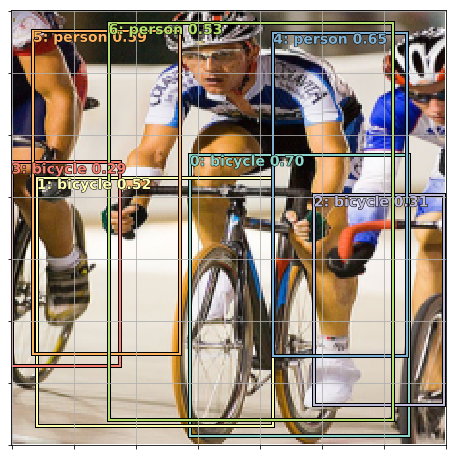

In [578]:
fig, ax = plt.subplots(figsize=(8,8))
torch_gt(ax, ima, out2, cc, out1, 0.1)

## End